In [1]:
import os

import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
from torchvision import transforms
from torchvision.utils import make_grid

import matplotlib.pyplot as plt

from PIL import Image
from IPython.display import Image as IPImage

from helpers import select_device

In [2]:
device = select_device()

sh: nvidia-smi: command not found


In [3]:
DATA_PATH = 'data'
DOG_IMG_PATH = os.path.join(DATA_PATH, 'dog.jpg')
IMAGENET_CLASSES_PATH = os.path.join(DATA_PATH, 'imagenet_classes.txt')

# Load the data and prepare model

In [4]:
# load network
net = torch.hub.load('pytorch/vision:v0.9.0', 'vgg11', pretrained=True)
net = net.eval().to(device)

# we are not changing the network weights/biases in this lab
for param in net.parameters():
    param.requires_grad = False
print(net)

# image to tensor transform with normalization
transform = transforms.Compose([
    transforms.Resize(224),
    transforms.ToTensor(),
    transforms.Normalize(
        mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225]
    )])

Using cache found in /Users/jr/.cache/torch/hub/pytorch_vision_v0.9.0
/Users/jr/.pyenv/versions/3.11.5/envs/dle/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/Users/jr/.pyenv/versions/3.11.5/envs/dle/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG11_Weights.IMAGENET1K_V1`. You can also use `weights=VGG11_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


VGG(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (3): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (4): ReLU(inplace=True)
    (5): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (6): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (7): ReLU(inplace=True)
    (8): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (9): ReLU(inplace=True)
    (10): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (11): Conv2d(256, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (12): ReLU(inplace=True)
    (13): Conv2d(512, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (14): ReLU(inplace=True)
    (15): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
 

# Assignment 1
First, we load the image, transform it by the ImageNet transformation pipeline and we classify it. We will use `softmax` and `argsort` to obtain the top 10 classes with highest predicted probabilities.

In [5]:
# load the image and add batch dimension
dog_img = Image.open(DOG_IMG_PATH)
dog_img_transformed = transform(dog_img).unsqueeze(0).to(device)

# load classes
imagenet_classes = np.array(open(IMAGENET_CLASSES_PATH, 'r').read().strip().split('\n'))

# apply classifier and remove batch dimension
# the softmax is not necessary to get the top classes, because it preserves the ordering, but I wanted to show the probabilities as well
probs = net(dog_img_transformed).squeeze(0).softmax(0)

# get top 10 classes with the highest probability
top10 = torch.argsort(probs, descending=True).cpu()[:10]
print(f'The top 10 predicted classes are with probabilities:')
for i in top10:
    print(f'[{i}] {imagenet_classes[i]}: {probs[i]:.4f}')

The top 10 predicted classes are with probabilities:
[208] Labrador retriever: 0.7002
[207] golden retriever: 0.1126
[209] Chesapeake Bay retriever: 0.0970
[163] bloodhound, sleuthhound: 0.0078
[178] Weimaraner: 0.0061
[227] kelpie: 0.0059
[222] kuvasz: 0.0055
[852] tennis ball: 0.0051
[159] Rhodesian ridgeback: 0.0044
[168] redbone: 0.0042


We see that the top predicted class is a *Labrador retriever* with a probability $0.70$. Second next high probability class is *golden retriever* with a probability $0.11$. The other classes have probabilities very low compared to the top two classes. One interesting thing is that there are $9$ dog breeds among the top 10 classes and then tennis ball with probability $0.005$.

Next we show the original image and then the transformed one that is used for classification. The other image is also normalized so that the pixel values are in the correct range.

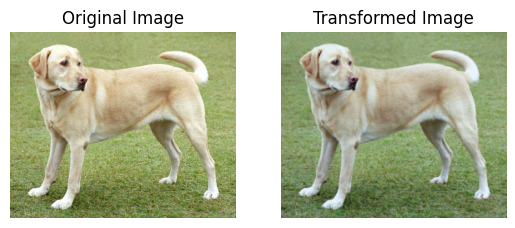

In [6]:
# visualize the original image and the transformed image
fig, axes = plt.subplots(1, 2)
axes[0].axis('off')
axes[0].set_title('Original Image')
axes[0].imshow(dog_img)

grid = make_grid(dog_img_transformed, nrow=1, normalize=True)
transformed_image = grid.permute(1, 2, 0).cpu().numpy()
axes[1].axis('off')
axes[1].set_title('Transformed Image')
axes[1].imshow(transformed_image)

The images are still very similar even though it is noticeable that the image is darker (normalizing by `mean` and `std` of the ImageNet dataset) and is slightly subsampled by the transformation. It is resized to size $224$ but here it is displayed in the same size as the original much bigger image so it looks less sharp.

# Assignment 2
The task here is to compute the $l_2$ norms over the activation channels for each of the 21 feature maps and to display them in a grid.
We do it by iteratively feeding the image through the model layer by layer and computing the norms of the activations over the channel dimensions.

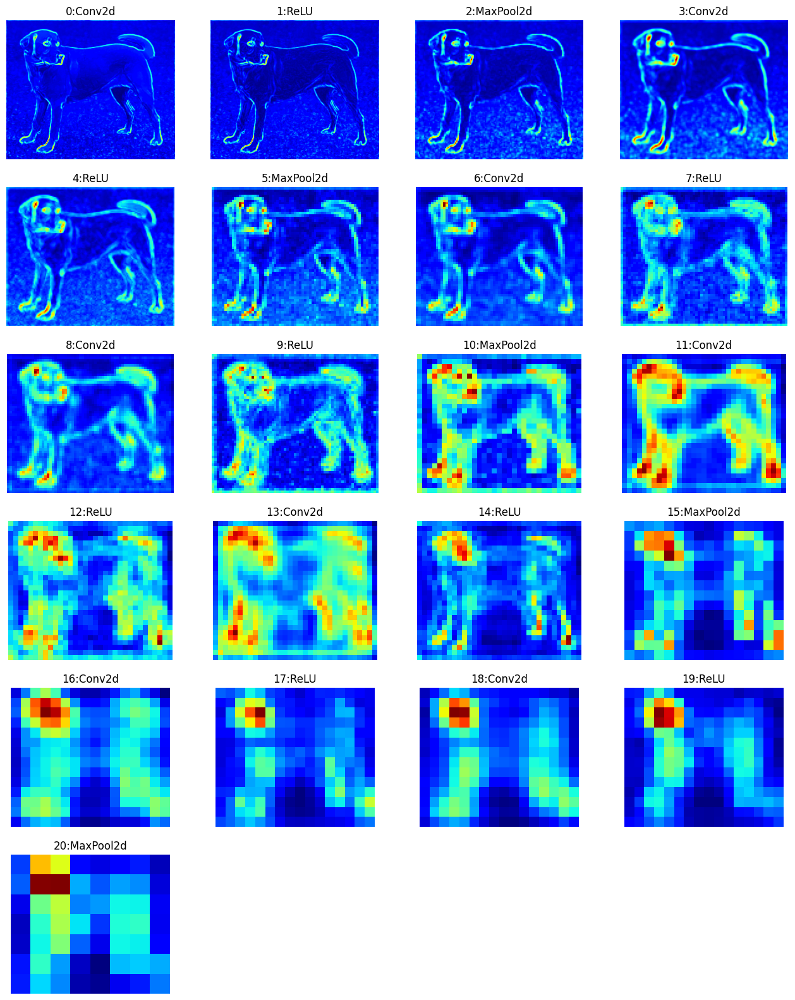

In [7]:
x = dog_img_transformed  # input image (tensor)
fig, axs = plt.subplots(nrows=6, ncols=4, figsize=(16, 20))

# turn off axis for all subplots
for ax in axs.flat:
    ax.set_axis_off()

# fill some subplots with the layer feature maps
for (i, l) in enumerate(net.features):
    x = l.forward(x)
    f = (x.detach()**2).sum(dim=1).sqrt()[0]
    axs.flat[i].imshow(f.cpu().numpy(), cmap='jet')
    axs.flat[i].set_title("{}:{}".format(i, l.__class__.__name__))

I think that the images confirm the notion we have about convolutional neural networks that the early layers learn simple features like edges, which can be seen in the first pictures. The later layers consider more broad regions of the image and higher level features. Also, we can clearly see that the spatial dimensions decrease as the image goes deeper in the network. The number of channels increases on the other hand but we cannot see it from these images because we compute their norm only.

Now we will do the same thing but for the gradients of the network score (for the predicted class) w.r.t. the activation maps in each layer. To do this we must enable saving the gradients for the actions in each layer during forward pass, then backpropagate the score of the predicted class (the class with the highest probability) and compute the channel norms of all activations.

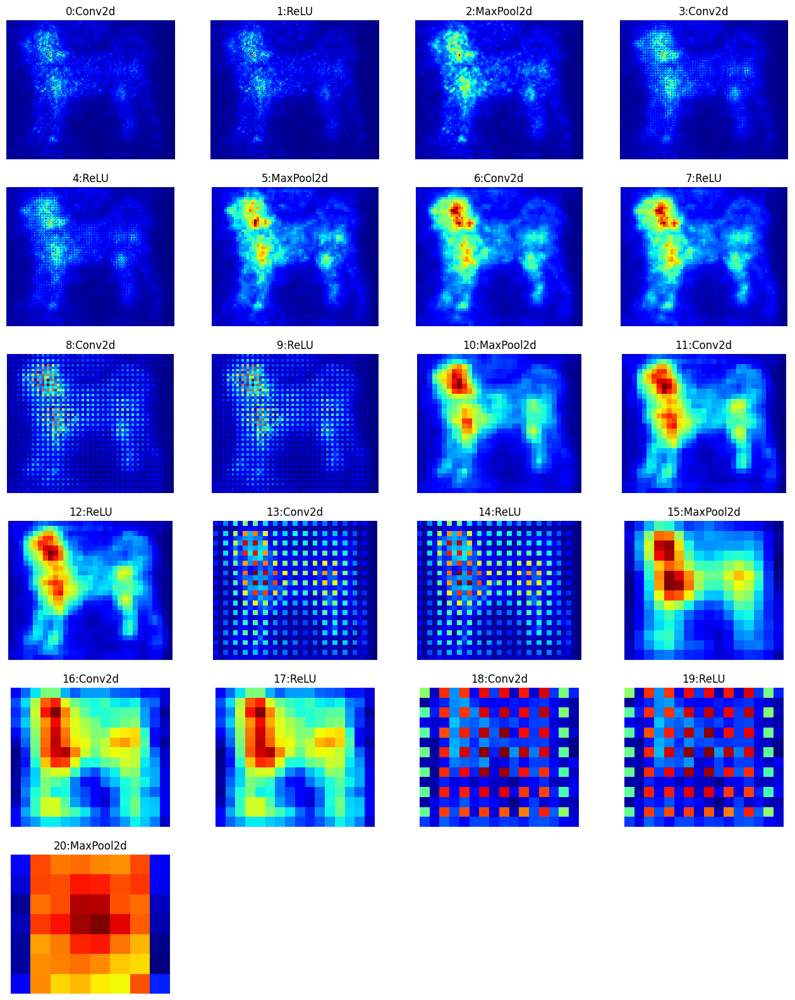

In [8]:
x = dog_img_transformed.clone().detach().to(device)
x.requires_grad = True
xs = []

# propagate through features and save the x to list for each layer
for (i, l) in enumerate(net.features):
    x = l.forward(x)
    x.retain_grad()
    xs.append(x)
# propagate through the rest of the network
x = net.avgpool.forward(x)
x = net.classifier.forward(x.flatten())

# backpropagate based on the predicted class
x[x.argmax()].backward()

# display
fig, axs = plt.subplots(nrows=6, ncols=4, figsize=(16, 20))

# turn off axis for all subplots
for ax in axs.flat:
    ax.set_axis_off()

for (i, x) in enumerate(xs):
    # compute norm over the color channels
    # x has shape (batch, color, w, h) so we sum over dimension 1 and take the first element
    grad = (x.grad ** 2).sum(dim=1).sqrt()[0]
    axs.flat[i].imshow(grad.cpu().numpy(), cmap='jet')
    axs.flat[i].set_title("{}:{}".format(i, net.features[i].__class__.__name__))

As mentioned during the lab, we can see that the gradients become separated in some layers. That is caused by the MaxPooling layers.

Apart from that, we can see that the gradient is bigger in areas where are probably more important features of the image. The gradients are much bigger around the dog's head and body and in they kind of outline the body of the dog. The gradients of the background, on the other hand, are of much smaller norms.

# Assignment 3

In this assignment, we want to find such image patterns that maximize neuron activations in respective layers. We will do it by numerical optimization over the input patch.

We will start from a patch of zeros (black pixels) and iteratively propagate it through the network up to the target layer whose activations we want to maximize. Here we take the activation in the center of the image and backpropagate the gradients for that pixel and selected feature channel. We sped this up by the trick suggested on the website.

Additionally, we introduce smoothing of the features to make it look more like a path of a real image. In the visualisations, we show both smooth and non-smoothed variants of the patches for comparison. We do this by applying a smoothing convolution $A$ and constraining it such that the norm of the difference between the original and smoothed patch is smaller than some value $\epsilon$. We show more values of $\epsilon$ to see which values are useful and which are not very useful.

First we need to compute the receptive field of a neuron in a given layer. We do this by using the information about stride and kernel sizes of the convolutional layers. We use the formula $$r_l = r_{l-1} + (k_l - 1) * s_l * S_{l-1}$$, where $r_l$ is the receptive field of the neuron in layer $l$, $r_{l-1}$ is the receptive field of the neuron in the previous layer, $k_l$ is the kernel size of the layer $l$, $s_l$ is the stride of the layer $l$ and $S_{l-1}$ is a product of strides of all the previous layers.

In [9]:
# compute receptive field of network feature layers
def receptive_field(net, l):
    r = 1
    s = 1
    for i in range(l + 1):
        layer = net.features[i]
        if isinstance(layer, nn.Conv2d):
            sl = layer.stride[0]
            kl = layer.kernel_size[0]
        elif isinstance(layer, nn.MaxPool2d):
            sl = layer.stride
            kl = layer.kernel_size
        else: # capture ReLU in this case
            sl = 1
            kl = 1
        s *= sl
        r += (kl - 1) * s
    return r

Just for a sanity check we show how the receptive field changes with depth of our network.

In [10]:
for (i, l) in enumerate(net.features):
    print(f'{i}:{l.__class__.__name__}: {receptive_field(net, i)}')

0:Conv2d: 3
1:ReLU: 3
2:MaxPool2d: 5
3:Conv2d: 9
4:ReLU: 9
5:MaxPool2d: 13
6:Conv2d: 21
7:ReLU: 21
8:Conv2d: 29
9:ReLU: 29
10:MaxPool2d: 37
11:Conv2d: 53
12:ReLU: 53
13:Conv2d: 69
14:ReLU: 69
15:MaxPool2d: 85
16:Conv2d: 117
17:ReLU: 117
18:Conv2d: 149
19:ReLU: 149
20:MaxPool2d: 181


Now, we can maximize the activations as mentioned before. During the implementation, we noticed that the resulting patches have grey border on the top and left side. This was after normalization of the image to the range $[0, 1]$, so before that the value must have been 0, i.e. black. That means that during the gradient optimization, these values were probably never updated or the gradients were zero. We experimented a little bit with this and found out that if we adjust the integer division `sz[.] // 2` by `-1` the gray border moves to the right and bottom border. I think, that this can mean that because the size of the image is even, thus the selected center is not exactly in the center of the image, the sides are not connected to the graph when computing the gradients.

To combat this, we do not take the center as a single pixel (for even sized images) but we take all the 4 center pixels and compute loss w.r.t. the average of these 4 center pixels. From what we can see by eye, the patterns did not change much but the grey border disappeared.

In [11]:
def get_center(dim1: int, dim2: int):
    dims1 = [dim1 // 2]
    dims2 = [dim2 // 2]
    if dim1 % 2 == 0:
        dims1.append(dim1 // 2 - 1)
    if dim2 % 2 == 0:
        dims2.append(dim2 // 2 - 1)
    return dims1, dims2

def activation_max(net, layer: int, steps:int=2000, lr=3e-3, smooth=False, epsilon=1e-1):
    apool = torch.nn.AvgPool2d(3, padding=0, stride=1)
    apad = torch.nn.ReplicationPad2d(1)

    # the +2 is to account for padding since I do no think we should consider the padding in the receptive field
    S = receptive_field(net, layer)

    # determine current number of channels (find closest previous convolutional layer which determines the dimension)
    for i in range(layer + 1):
        if isinstance(net.features[layer - i], nn.Conv2d):
            channels = net.features[layer - i].out_channels
            break

    # small image of size of the receptive field of the layer initialized with zeros
    x = torch.nn.Parameter(torch.zeros(channels, 3, S, S), requires_grad=True).to(device)

    optimizer = torch.optim.Adam([x], lr=lr)
    for i in range(steps):
        optimizer.zero_grad()

        # forward propagation to the specified layer
        y = net.features[:layer+1](x)

        # compute loss and backpropagate
        sz = y.shape
        # get the center of the image
        center1, center2 = get_center(sz[2], sz[3])
        loss = sum([y[:, :, c1, c2].diag().sum() for c1 in center1 for c2 in center2]) / (len(center1) * len(center2))
        loss.backward()

        # update the parameters
        optimizer.step()

        # clip the values to [-1, 1] (no need to compute gradients for this operation)
        with torch.no_grad():
            x.clamp_(-1.0, 1.0)

        # smooth the values so they resemble patches of real images
        if smooth:
            with torch.no_grad():
                xx = apool(apad(x))
                diff = x - xx
                dn = torch.linalg.norm(diff.flatten(2), dim=2, ord=1.0) / (S * S)
                if dn.max() > epsilon:
                    x.data[dn > epsilon] = xx[dn > epsilon]

    return x

In [12]:
def show_activation_max(net, layer, epsilon):
    fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(18, 8))
    for ax in axes.flat:
        ax.set_axis_off()

    x = activation_max(net, layer, epsilon=epsilon, smooth=False).detach()
    nrow = int(np.ceil(np.sqrt(x.shape[0])))
    grid = make_grid(x, nrow=nrow, normalize=True, padding=1)
    image = grid.cpu().numpy().transpose(1, 2, 0)
    axes[0].set_title(f'{layer}:{net.features[layer].__class__.__name__} \n without smoothing')
    axes[0].imshow(image)

    x = activation_max(net, layer, epsilon=epsilon, smooth=True).detach()
    grid = make_grid(x, nrow=nrow, normalize=True, padding=1)
    image = grid.cpu().numpy().transpose(1, 2, 0)
    axes[1].set_title(f'{layer}:{net.features[layer].__class__.__name__} \n smoothing (epsilon={epsilon})')
    axes[1].imshow(image)

    return fig

## Layer 0 (First convolutional layer)
Here, we show the maximizing patterns for different values of $\epsilon$ to see which are promising.

All experiments even for the other layers are run for $2000$ steps with learning rate $0.003$. As mentioned before, we run both the smooth and non-smooth variant for comparison.

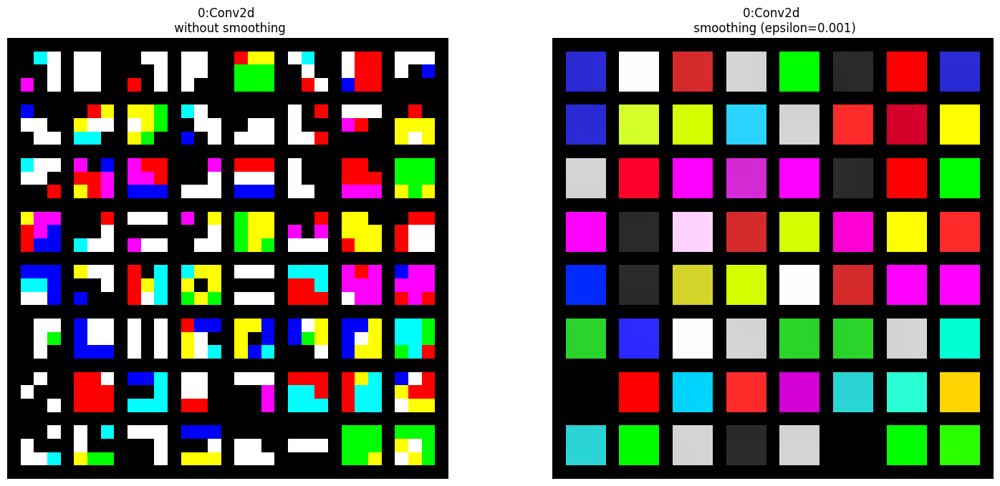

In [13]:
show_activation_max(net, 0, epsilon=1e-3);

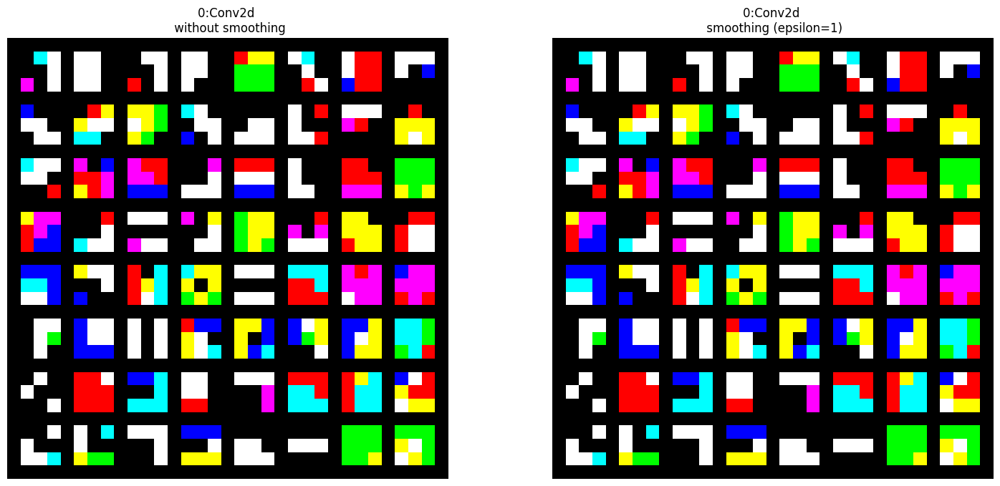

In [14]:
show_activation_max(net, 0, epsilon=1);

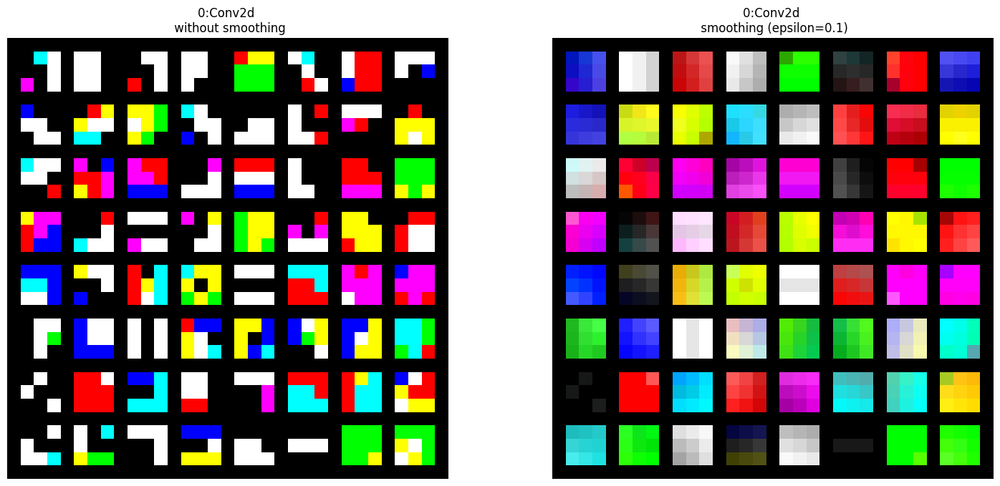

In [15]:
show_activation_max(net, 0, epsilon=1e-1);

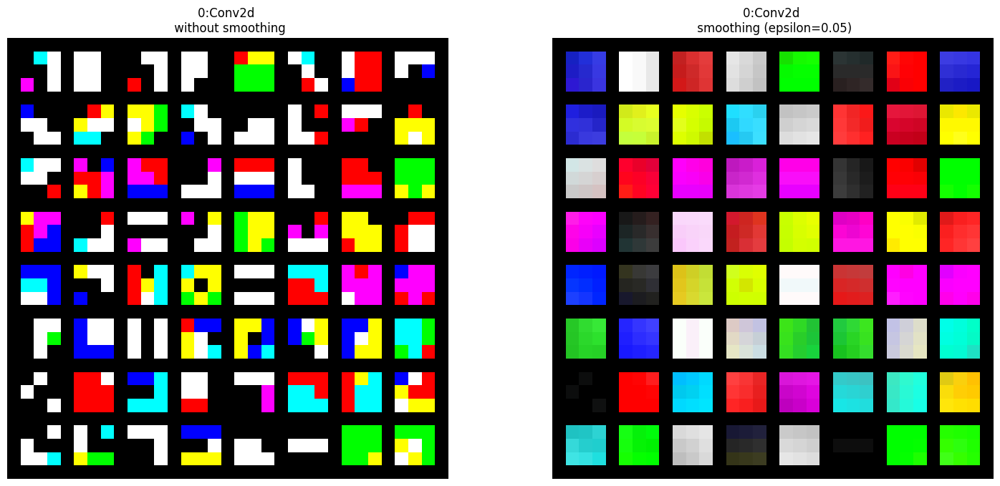

In [16]:
show_activation_max(net, 0, epsilon=5e-2);

From these images we can clearly see that the $\epsilon$ value must be smaller than $1$ and bigger than $0.001$ because when epsilon is $1$, the smoothing does nothing and when the epsilon is $0.001$ the patches are too smoothed that they look as just one color.
The values $0.1$ and $0.05$ both look good and I cannot tell which one is more realistic. The smaller of these two is definitely more smooth but I think that both of these can be a part of a real image.

## Layer 3 (Second convolutional layer)

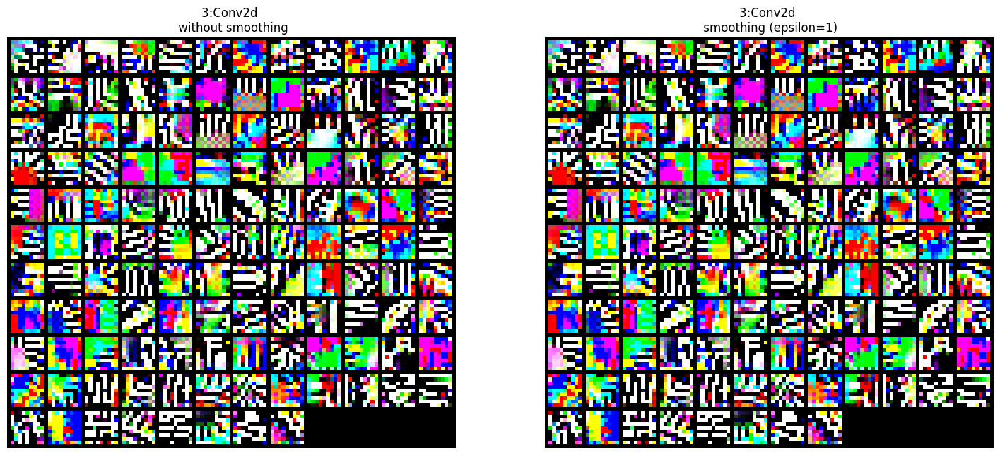

In [17]:
show_activation_max(net, 3, epsilon=1);

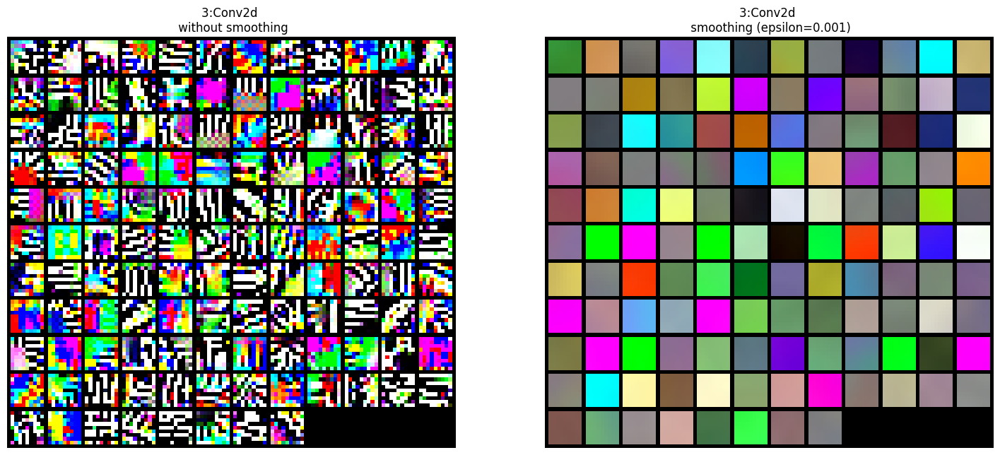

In [18]:
show_activation_max(net, 3, epsilon=1e-3);

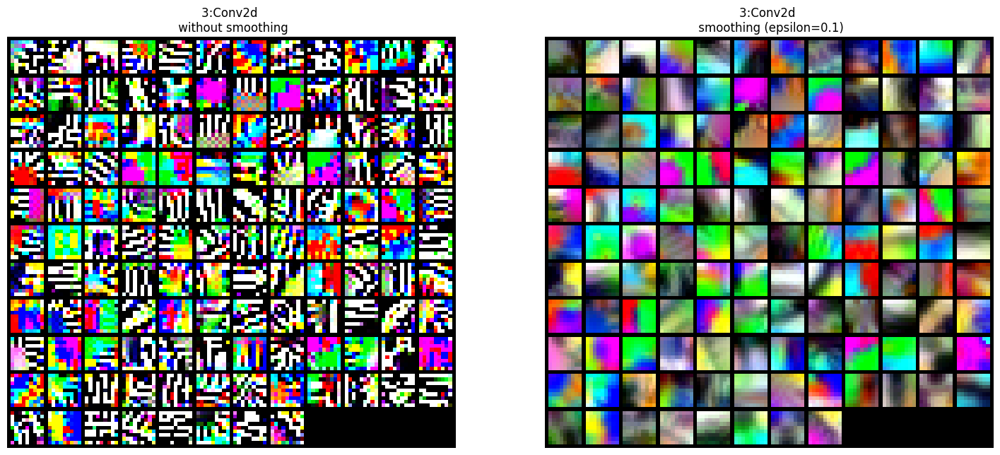

In [19]:
show_activation_max(net, 3, epsilon=1e-1);

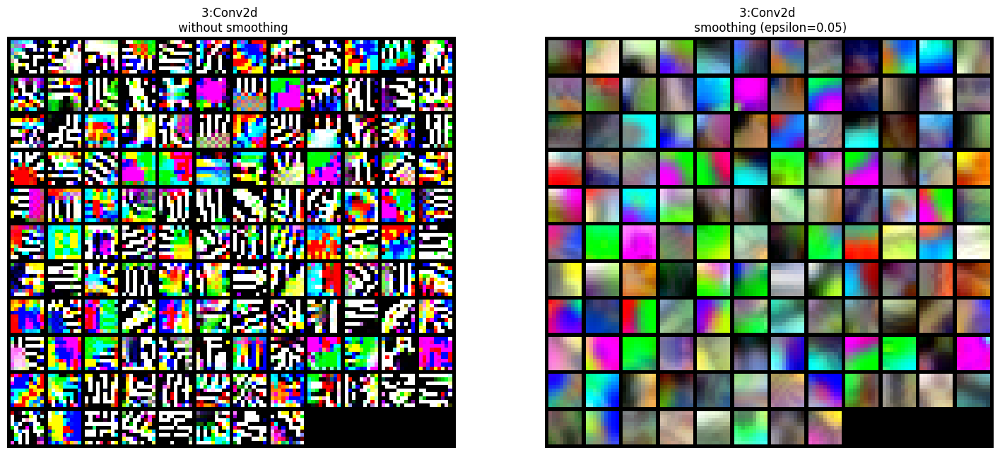

In [20]:
show_activation_max(net, 3, epsilon=5e-2);

Even for the second layer we can see the same phenomenon as with the first layer. From this we conclude that the best value of $\epsilon$ is probably around $0.05$.

## Deeper layers

Deeper layers took me a long time to optimize so I put the results into `output` folder and load them from there.

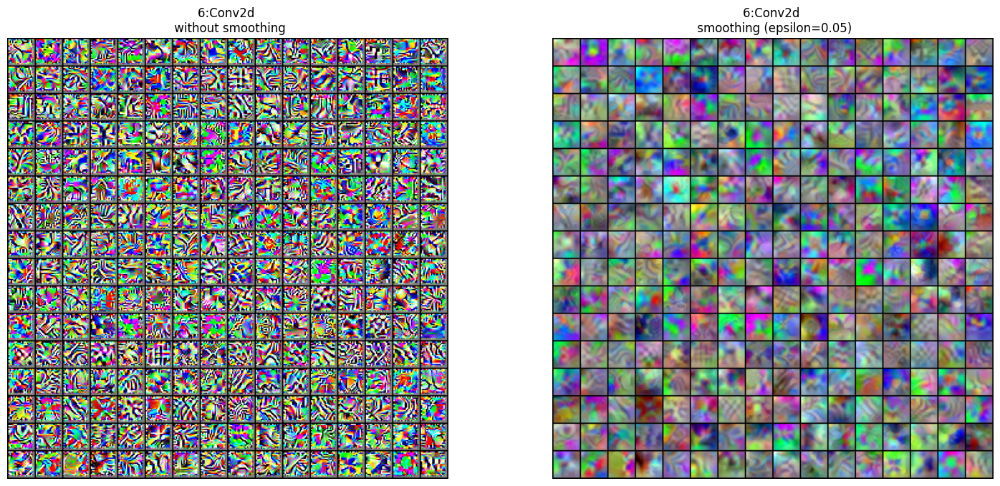

In [21]:
IPImage(filename='output/layer6.png')

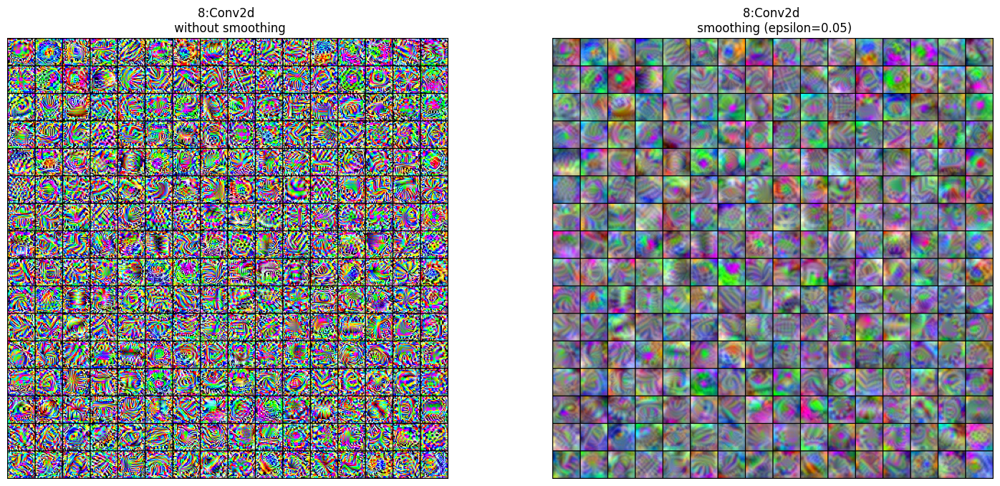

In [22]:
IPImage(filename='output/layer8.png')

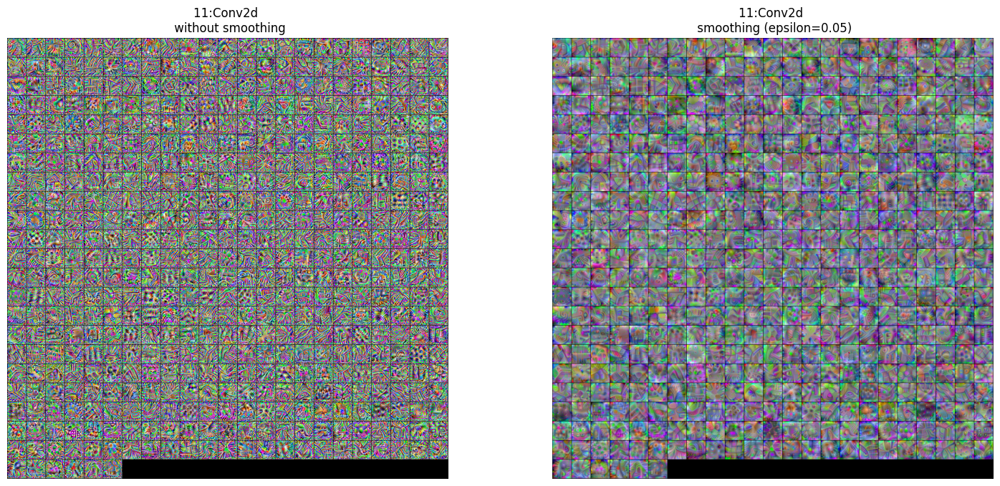

In [23]:
IPImage(filename='output/layer11.png')

# Assignment 4

In this assignment we will perform a targeted attack on the network. We select the provided image of a *Labrador retriever* and try to change the image so that the network classifies it as a *wall clock*.

We do it by optimizing cross-etropy loss with the target class while staying in a ball of radius epsilon w.r.t. $l_{\infty}$ norm. The optimization was run for $100$ steps with learning rate $0.003$.

In [24]:
def attack(x_clean: torch.Tensor, net: torch.nn.Module, target_class: int, steps: int, epsilon: float, lr: float):
    x_target = x_clean.clone().detach().to(device).requires_grad_(True)

    # encode target class as one-hot vector so that it can be used in cross-entropy loss
    t_target_one_hot = torch.zeros(1000).to(device)
    t_target_one_hot[target_class] = 1

    optimizer = torch.optim.Adam([x_target], lr=lr)

    for _ in range(steps):
        optimizer.zero_grad()
        y = net(x_target).squeeze(0).softmax(0)
        loss = F.cross_entropy(y, t_target_one_hot)
        loss.backward()
        optimizer.step()

        dx = (x_target.detach() - x_clean)
        dn = dx.flatten().norm(p=float('inf'))
        div = torch.clamp(dn/epsilon, min=1.0)
        dx = dx / div
        x_target.data = x_clean + dx

    return x_target.detach()

In [25]:
# select clean image -> provided labrador
x_clean = transform(dog_img).unsqueeze(0).to(device)
t_clean = 208

# choose target class
t_target = 892 # "wall clock"

# fix epsilon
epsilon = 1e-1
lr = 3e-3
steps = 100

x_target = attack(x_clean, net, t_target, steps, epsilon, lr)

The top 10 predicted classes for the clean image:
[208] Labrador retriever: 0.7002
[207] golden retriever: 0.1126
[209] Chesapeake Bay retriever: 0.0970
[163] bloodhound, sleuthhound: 0.0078
[178] Weimaraner: 0.0061
[227] kelpie: 0.0059
[222] kuvasz: 0.0055
[852] tennis ball: 0.0051
[159] Rhodesian ridgeback: 0.0044
[168] redbone: 0.0042

The top 10 predicted classes for the target image:
[892] wall clock: 0.9791
[409] analog clock: 0.0094
[451] bolo tie, bolo, bola tie, bola: 0.0006
[260] chow, chow chow: 0.0006
[778] scale, weighing machine: 0.0006
[574] golf ball: 0.0005
[209] Chesapeake Bay retriever: 0.0005
[844] switch, electric switch, electrical switch: 0.0004
[850] teddy, teddy bear: 0.0004
[426] barometer: 0.0004



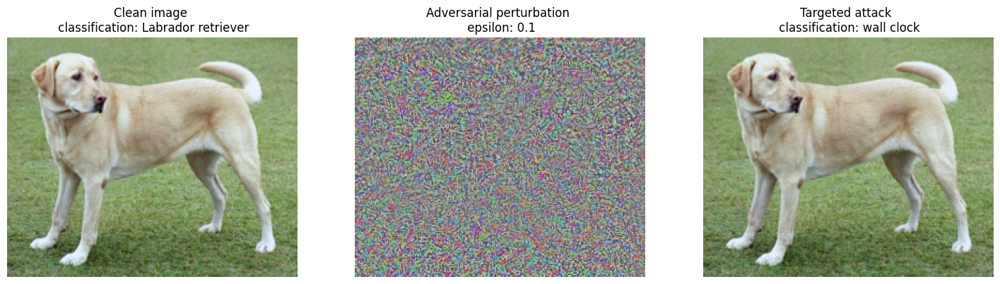

In [26]:
probs_clean = net(x_clean).squeeze(0).softmax(0)
top10_clean = torch.argsort(probs_clean, descending=True).cpu()[:10]
print(f'The top 10 predicted classes for the clean image:')
for i in top10_clean:
    print(f'[{i}] {imagenet_classes[i]}: {probs_clean[i]:.4f}')
print()

probs_target = net(x_target).squeeze(0).softmax(0)
top10_target = torch.argsort(probs_target, descending=True).cpu()[:10]
print(f'The top 10 predicted classes for the target image:')
for i in top10_target:
    print(f'[{i}] {imagenet_classes[i]}: {probs_target[i]:.4f}')
print()

fig, axes = plt.subplots(1, 3, figsize=(18, 8))
grid = make_grid(x_clean, nrow=1, normalize=True)
image = grid.permute(1, 2, 0).cpu().numpy()
axes[0].axis('off')
axes[0].set_title(f'Clean image \n classification: {imagenet_classes[top10_clean[0]]}')
axes[0].imshow(image)

grid = make_grid(x_target - x_clean, nrow=1, normalize=True)
image = grid.permute(1, 2, 0).cpu().numpy()
axes[1].axis('off')
axes[1].set_title(f'Adversarial perturbation \n epsilon: {epsilon}')
axes[1].imshow(image)

grid = make_grid(x_target, nrow=1, normalize=True)
image = grid.permute(1, 2, 0).cpu().numpy()
axes[2].axis('off')
axes[2].set_title(f'Targeted attack \n classification: {imagenet_classes[top10_target[0]]}')
axes[2].imshow(image)

With $\epsilon = 0.1$ we managed to learn such a change of the image that the network was successfully fooled and classified the image as a *wall clock* with probability $0.98$. Moreover, we can see that the constraint is correct because the changed image is not visually different compared to the original one.